In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imageio
from PIL import Image, ImageEnhance
import mahotas as mt
import skimage
from skimage.morphology import disk

In [2]:
from morph_texture import normalize, euclidean_distance

In [3]:
R, G, B = 0, 1, 2
H, W, CH = 0, 1, 2

In [4]:
def show(img, plt_size=(16, 10), cmap=None):
    fig = plt.figure(figsize=plt_size)
    plt.imshow(img, cmap=cmap if cmap is not None else (None if len(img.shape) == 3 else 'gray'))

In [5]:
downsize_factor = 8

In [6]:
img = imageio.imread('./test_img.png')
img = cv2.resize(img, (img.shape[W] // downsize_factor, img.shape[H] // downsize_factor))
gray = normalize(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY), (0, 255), np.uint8)

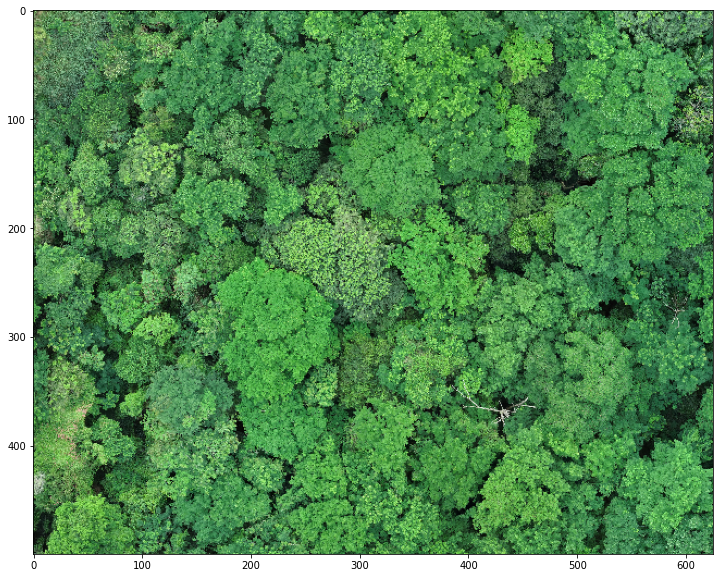

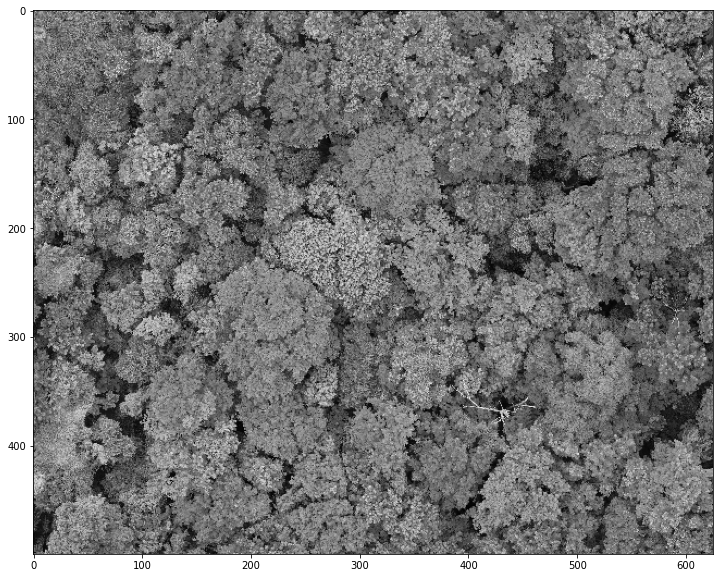

In [7]:
show(img)
show(gray)

In [8]:
enh = ImageEnhance.Contrast(Image.fromarray(gray))
highcontrast = enh.enhance(2.5)
hc = np.asarray(highcontrast)

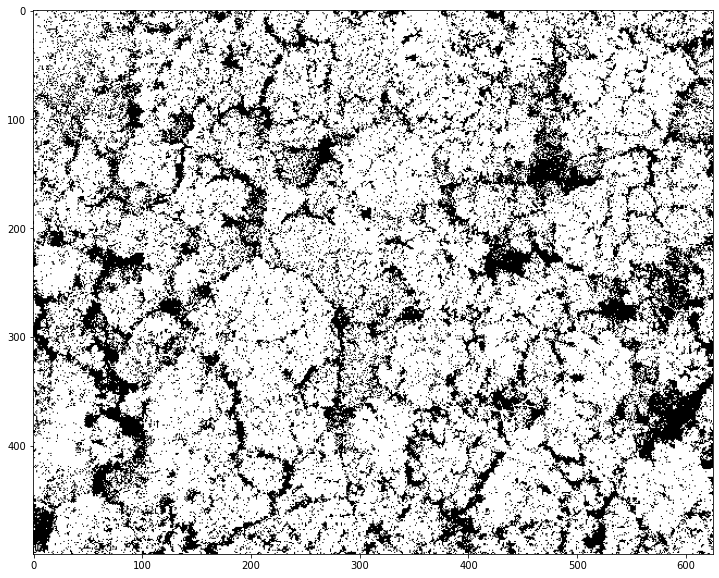

In [9]:
factor = 0.4
thresh, bin_img = cv2.threshold(hc, 80, 1, cv2.THRESH_OTSU)
_, bin_img = cv2.threshold(hc, int(thresh * factor), 1, cv2.THRESH_BINARY)
show(bin_img)

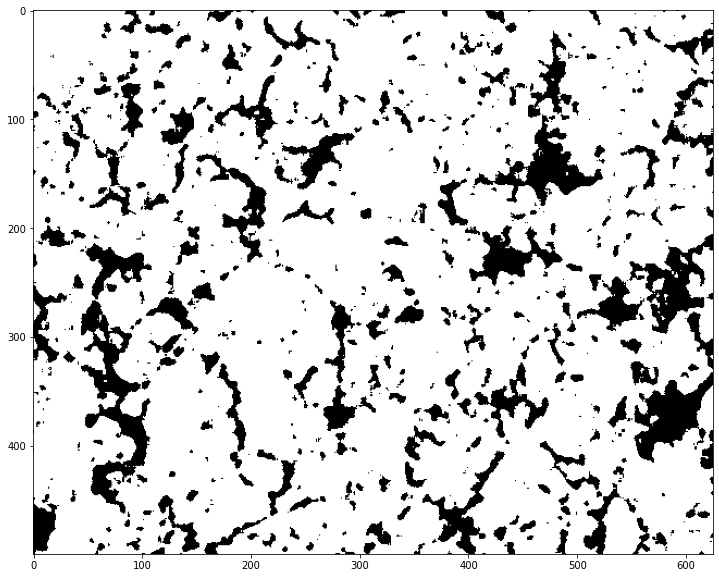

In [10]:
bin_blur = cv2.medianBlur(bin_img, 5)
show(bin_blur)

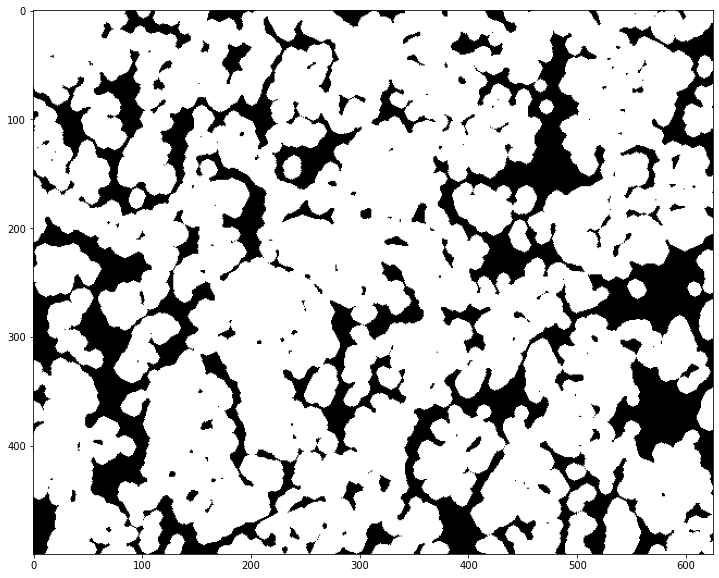

In [11]:
morph = cv2.morphologyEx(bin_blur, cv2.MORPH_OPEN, disk(3), iterations=2)
show(morph)

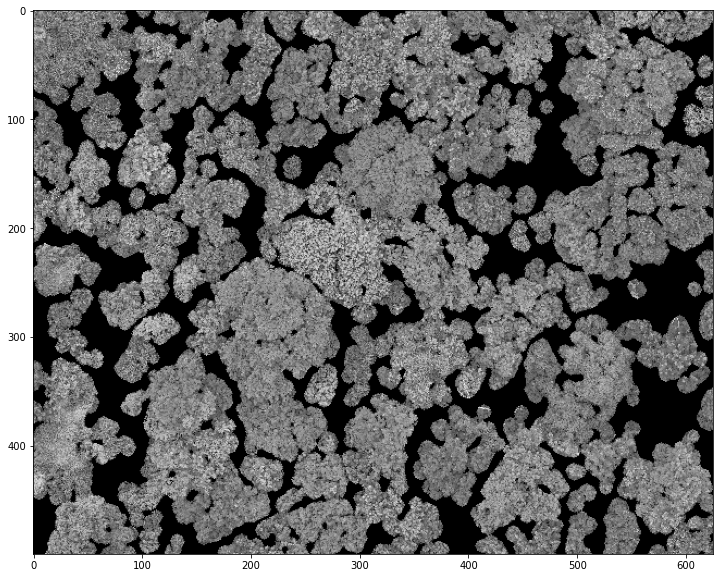

In [12]:
masked = gray.copy()
masked[morph == 0] = 0
masked = normalize(masked, (0, 255), np.uint8)
show(masked)

In [13]:
mean_px = np.mean(img, axis=(0,1))
reg = normalize(img - mean_px, (0, 255), np.uint8)

In [14]:
def open_img(img, disk_size):
    se = disk(disk_size)
    return cv2.morphologyEx(img, cv2.MORPH_OPEN, se)

In [15]:
def get_crown_size_layers(img, min_disk=3, max_disk=85):
    opened = {'images': {}, 'mean_diffs': {}}
    images = opened['images']
    for disk_size in range(min_disk, max_disk, 2):
        images[disk_size] = normalize(cv2.morphologyEx(img, cv2.MORPH_OPEN, disk(disk_size)))
    
    mean_diffs = opened['mean_diffs']
    for i, disk_size in enumerate(images.keys()):
        if disk_size == min_disk:
            continue
        diff = images[disk_size] - images[list(images.keys())[i - 1]]
        euc_dist = np.sqrt(np.sum(diff ** 2))
        mean_diffs[disk_size] = euc_dist
    return opened


In [16]:
csl = get_crown_size_layers(gray)

In [17]:
imgs = csl['images']

In [ ]:
np.min(imgs[3]), np.max(imgs[3])

In [ ]:
show(imgs[5] - imgs[3])

In [ ]:
show(imgs[83])

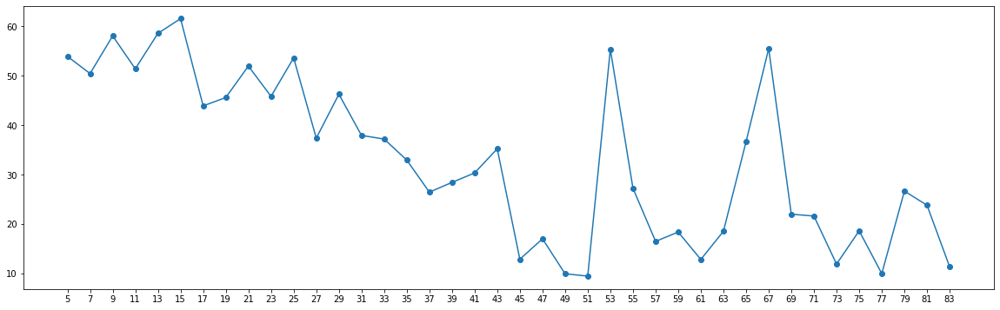

In [18]:
xs = []
ys = []
for sz in csl['mean_diffs']:
    xs.append(sz)
    ys.append(csl['mean_diffs'][sz])

plt.rcParams["figure.figsize"] = (20,6)
plt.plot(xs, ys, '-o')
plt.xticks(np.arange(min(xs), max(xs) + 1, 2))
plt.show()

In [19]:
crown_sizes = [9, 15, 21, 25, 29, 43, 53, 67, 79]

In [ ]:
for sz in crown_sizes:
    print(sz)
    show(imgs[sz])

In [20]:
def get_filtered(img, crown_sizes):
    filtered = {}
    for sz in crown_sizes:
        k = sz if sz % 2 == 1 else sz + 1
        filtered[sz] = normalize(cv2.GaussianBlur(img, (k, k), 0.3 * k), (0, 255), np.uint8)
    
    return filtered

In [21]:
filtered = get_filtered(gray, crown_sizes)

In [ ]:
for sz in filtered:
    show(filtered[sz])

In [22]:
def segment_layers(orig_img, filtered, thresh_factor, mask):
    result = {}
    
    for sz in filtered:
        img = 255 - filtered[sz]
        _, bin_img = cv2.threshold(img,
                                   thresh_factor * np.max(img),
                                   255,
                                   cv2.THRESH_BINARY_INV)
        components = cv2.connectedComponentsWithStats(bin_img)[1]
        result[sz] = cv2.watershed(orig_img, components)
    return result

In [23]:
watershed = segment_layers(img, filtered, 0.25, bin_blur)

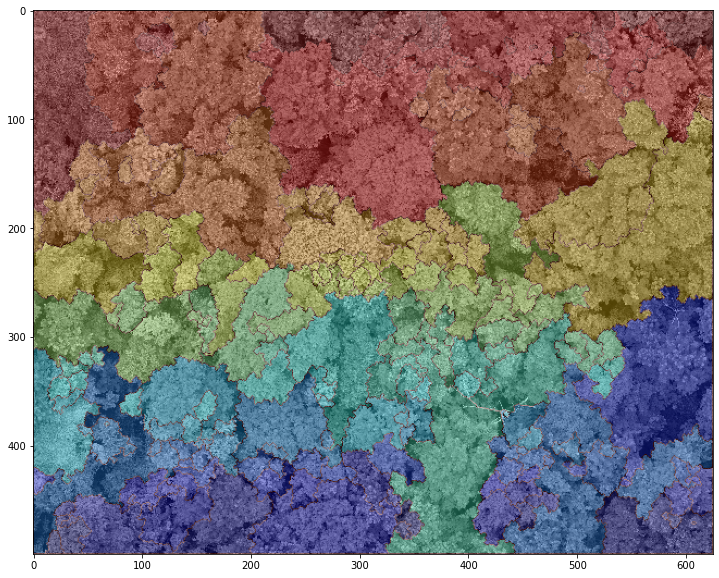

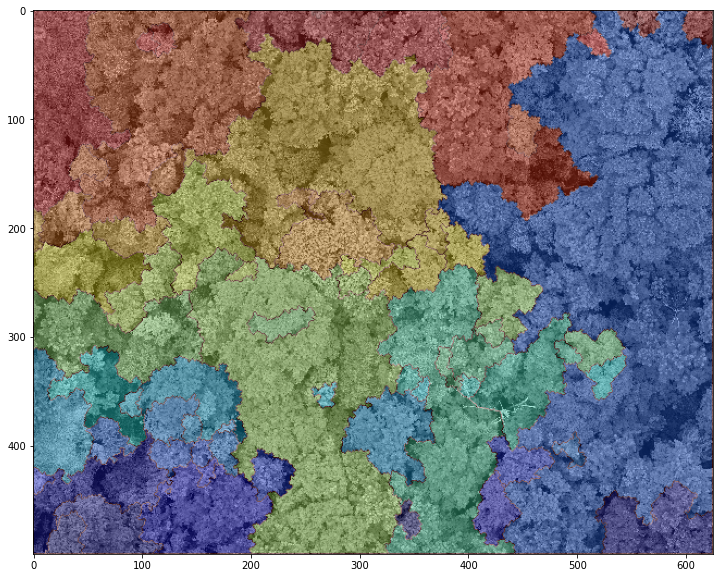

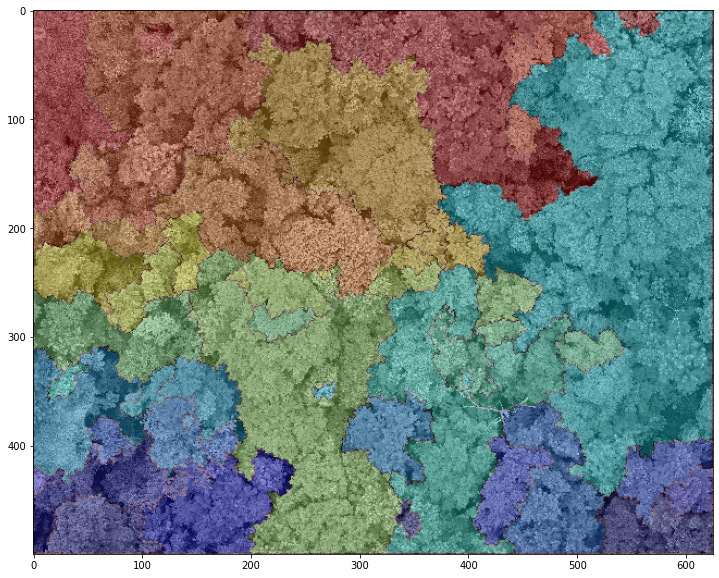

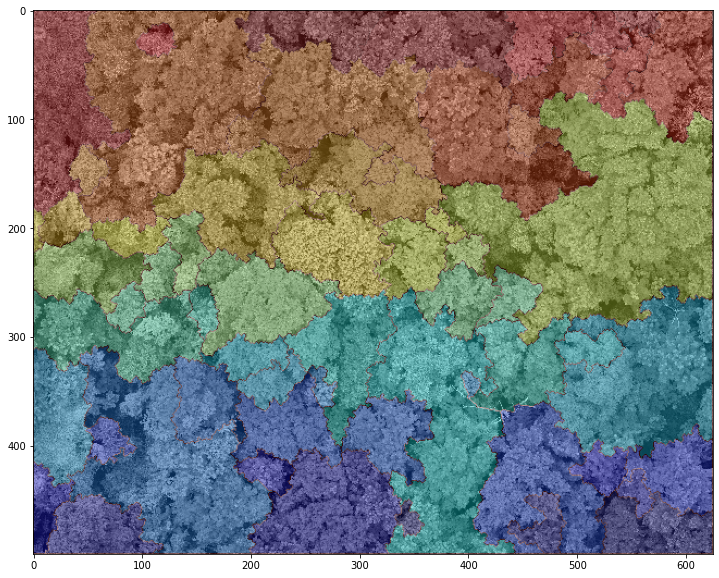

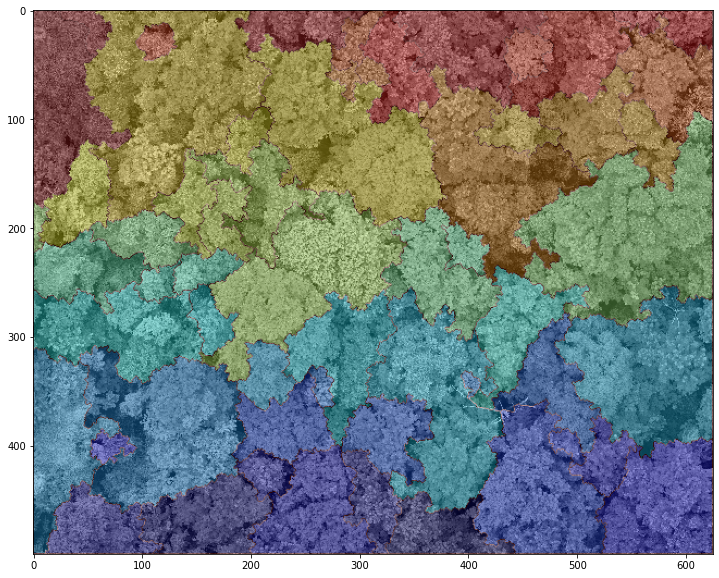

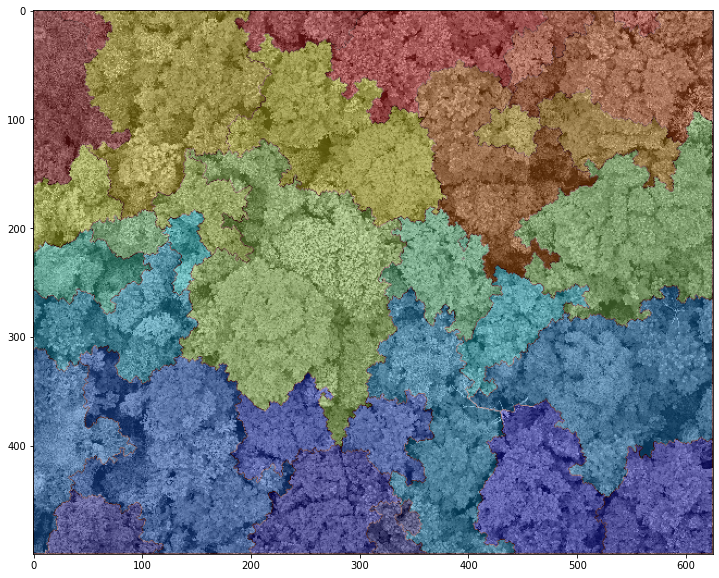

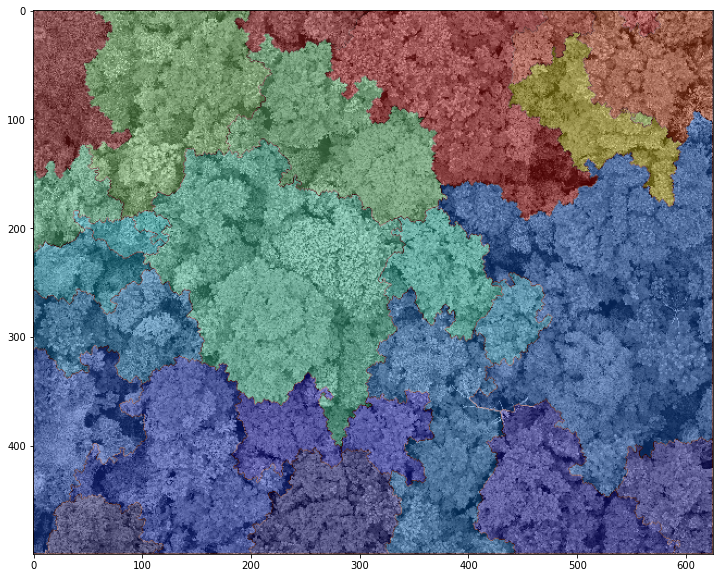

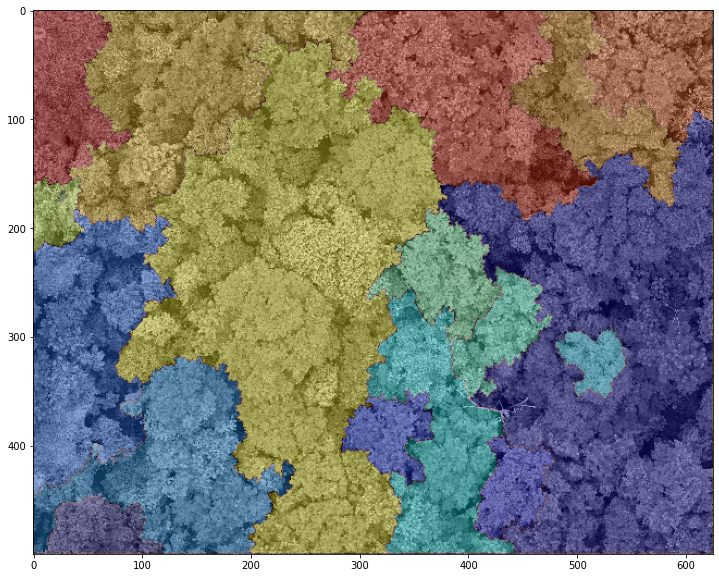

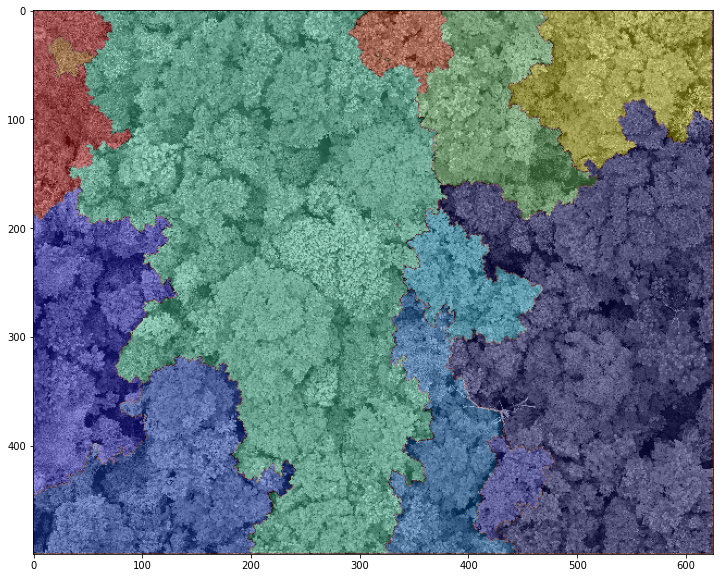

In [24]:
alpha = 0.7

for sz in watershed:
    mask = cv2.applyColorMap(normalize(watershed[sz], (0, 255), np.uint8), cv2.COLORMAP_JET)
    show(cv2.addWeighted(cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB), alpha, mask, 1 - alpha, 0))



In [25]:
tst = watershed[53]

In [26]:
np.unique(tst)

array([-1,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36], dtype=int32)

In [ ]:
show(img)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


/tmp/ipykernel_34271/3707652323.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=plt_size)


35
36


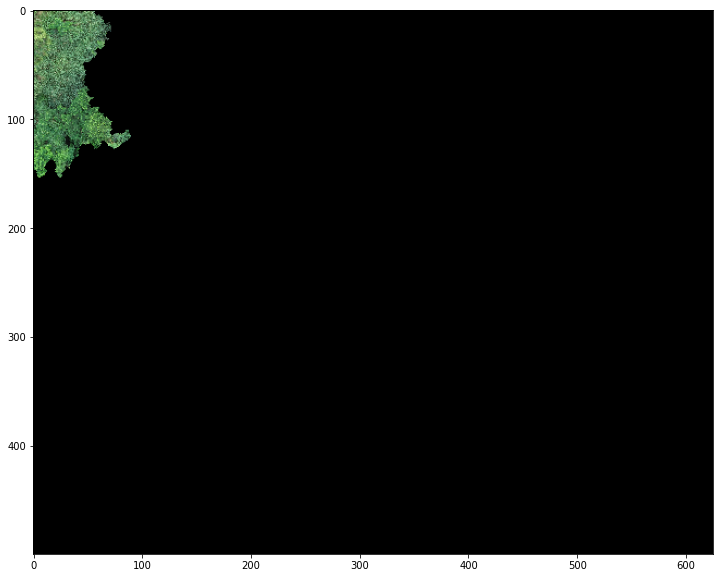

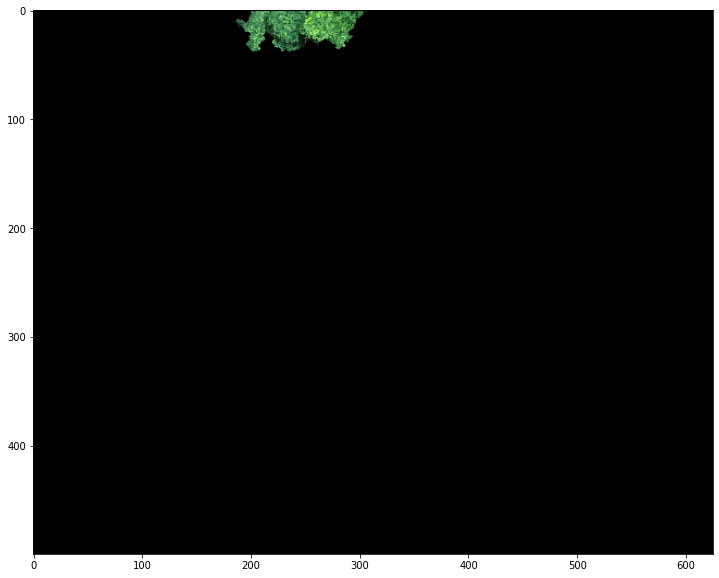

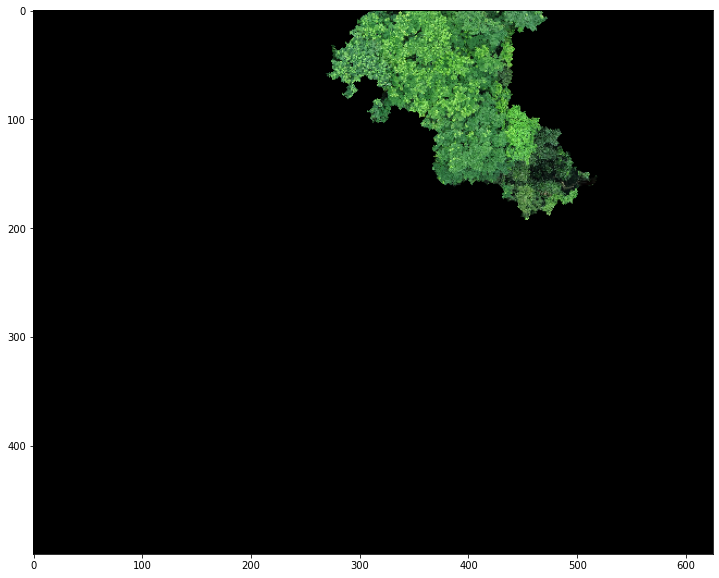

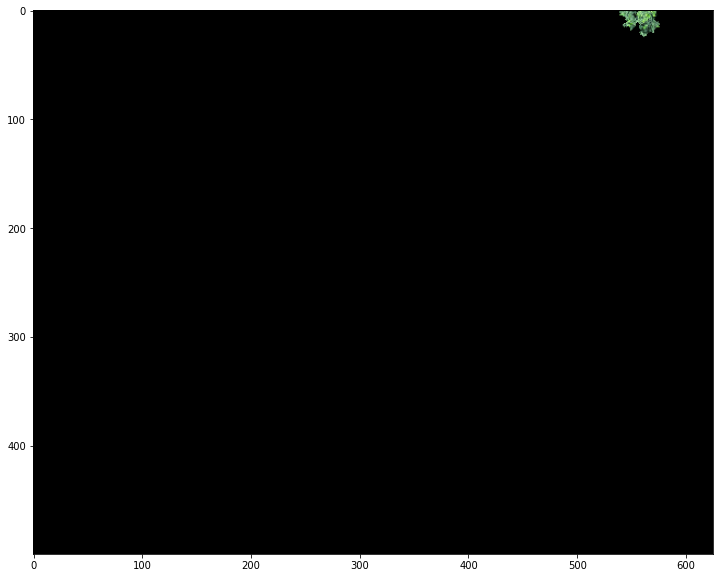

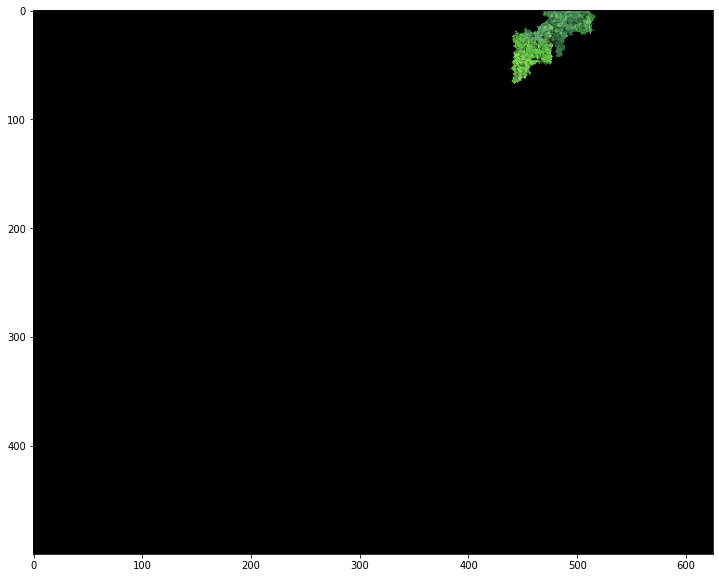

...

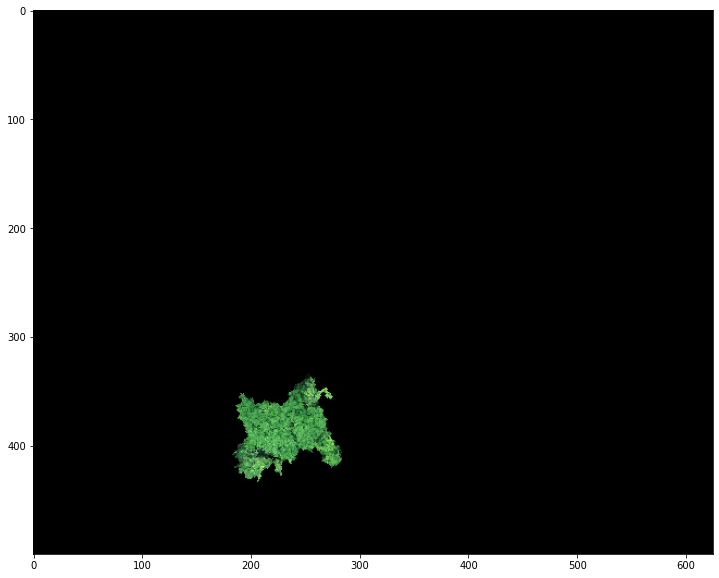

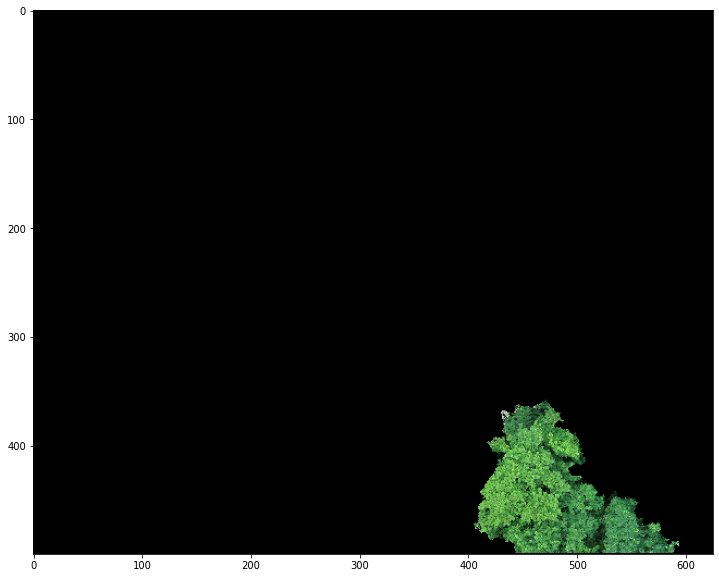

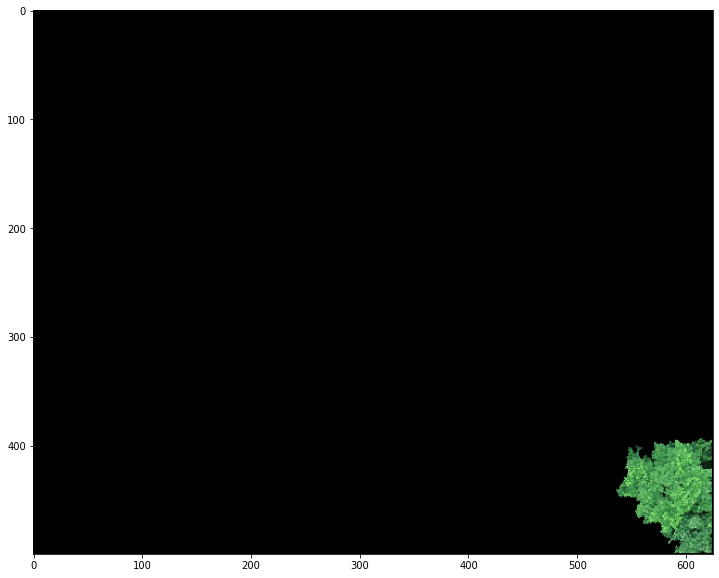

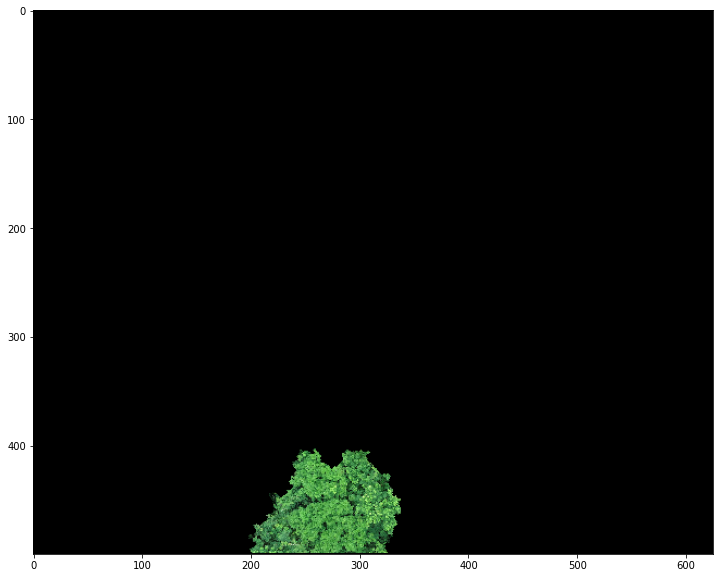

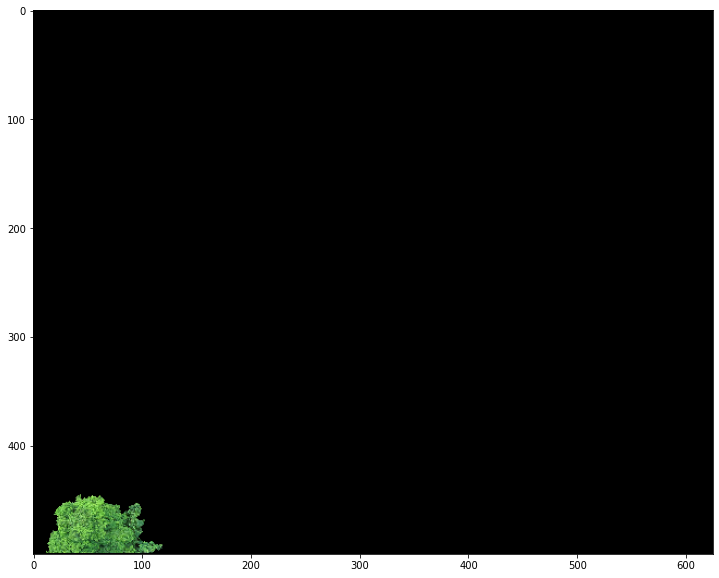

In [27]:
for region in [x for x in list(np.unique(tst)) if x != -1]:
    idxs = np.where(tst == region)
    r = np.zeros_like(img)
    r[idxs] = img[idxs]
    print(region)
    show(r)

36


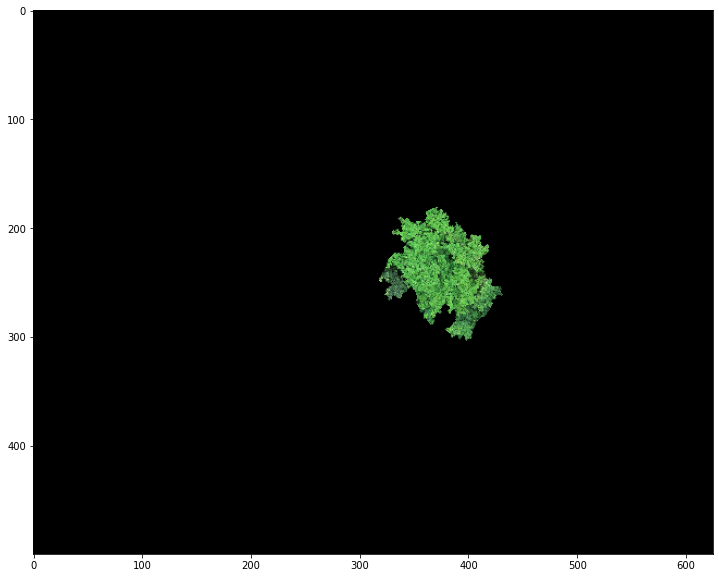

In [295]:
idxs = np.where(tst == 21)
r = np.zeros_like(img)
r[idxs] = img[idxs]
print(region)
show(r)

In [296]:
r = r.astype(np.float32)

In [297]:
mean_px = np.mean(r[idxs], axis=0)
mean_px

array([ 77.45771, 150.58861,  70.16031], dtype=float32)

In [298]:
r[idxs] -= mean_px

In [299]:
r[idxs] = normalize(r[idxs], type=np.float32)

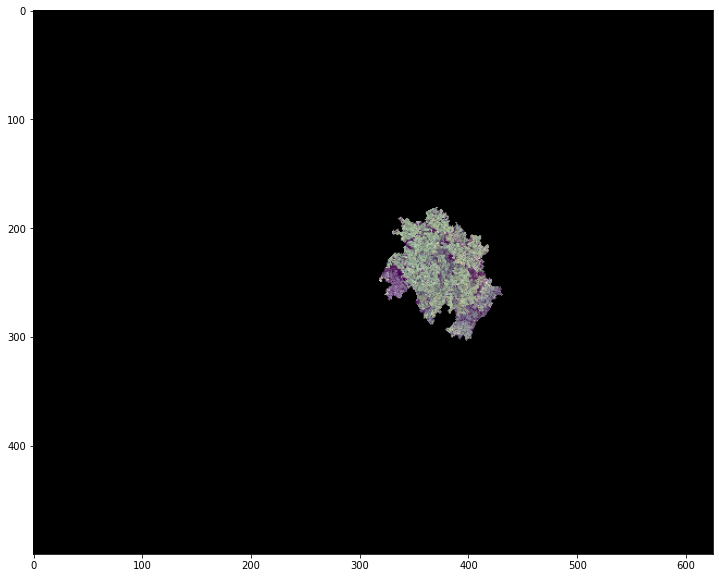

In [300]:
show(r)

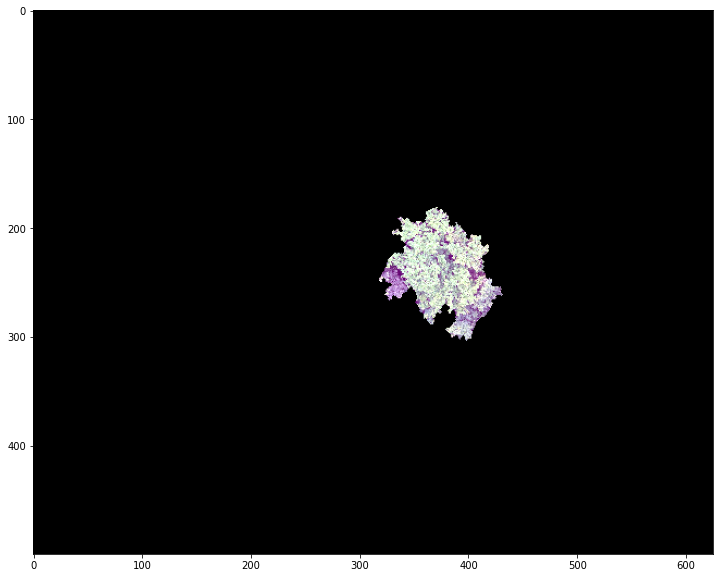

In [301]:
enh = ImageEnhance.Contrast(Image.fromarray(normalize(r, (0, 255), np.uint8)))
highcontrast = enh.enhance(1.5)
hc = np.asarray(highcontrast)
show(hc)

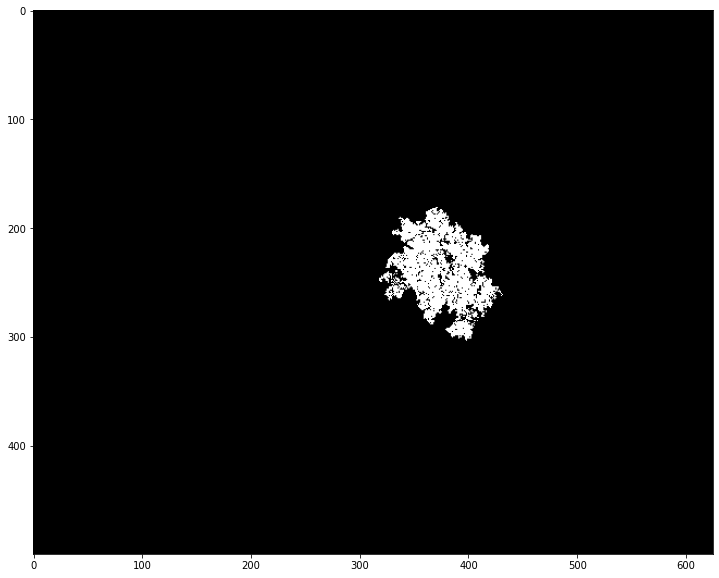

In [302]:
factor = 1.5
t, bin_seg = cv2.threshold(cv2.cvtColor(hc, cv2.COLOR_RGB2GRAY), 0, 255, cv2.THRESH_OTSU)
_, bin_seg = cv2.threshold(cv2.cvtColor(hc, cv2.COLOR_RGB2GRAY), factor * t, 255, cv2.THRESH_BINARY)
show(bin_seg)

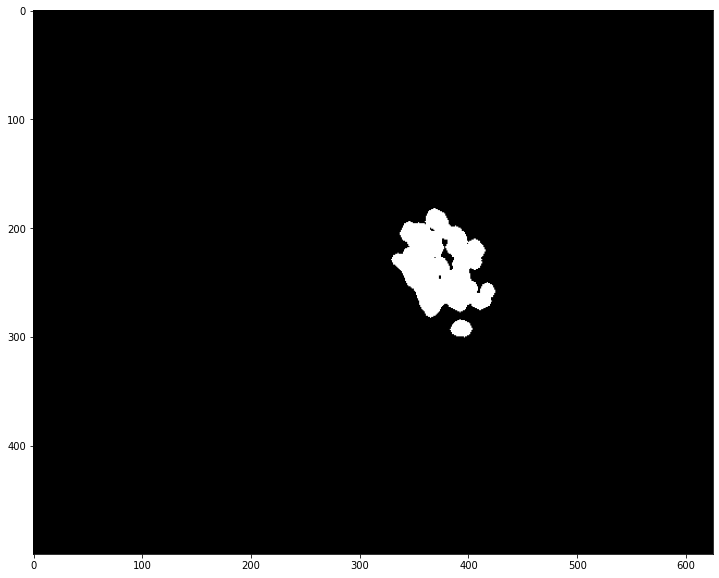

In [303]:
blur_seg = cv2.medianBlur(bin_seg, 5)
blur_seg = cv2.morphologyEx(blur_seg, cv2.MORPH_OPEN, disk(3), iterations= 2)

show(blur_seg)

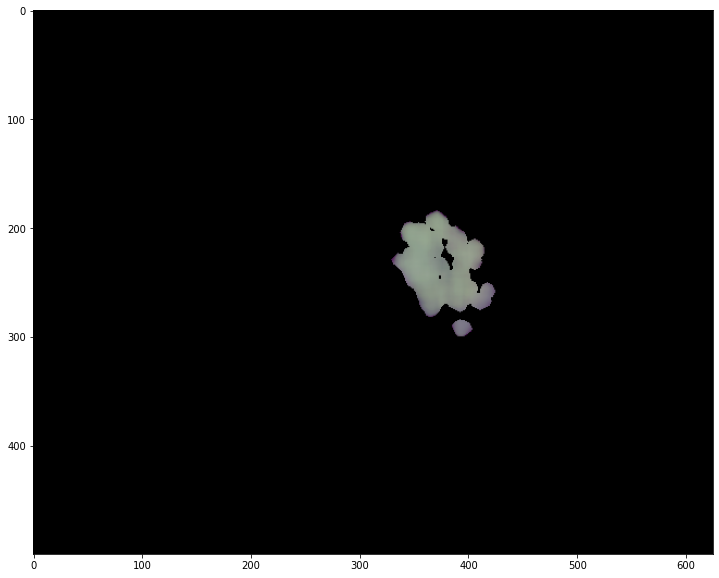

In [304]:
blurred = cv2.medianBlur(normalize(r, (0, 255), np.uint8), 21)
blurred[blur_seg == 0] = 0
show(blurred)


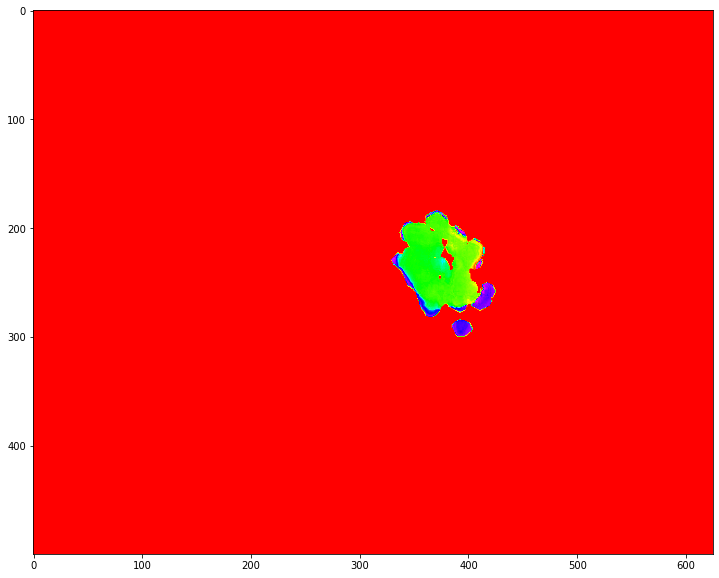

In [305]:
ks = 25

hue = cv2.cvtColor(blurred, cv2.COLOR_RGB2HSV)[:, :, 0].astype(np.uint8)
show(hue, cmap='hsv')

<BarContainer object of 173 artists>

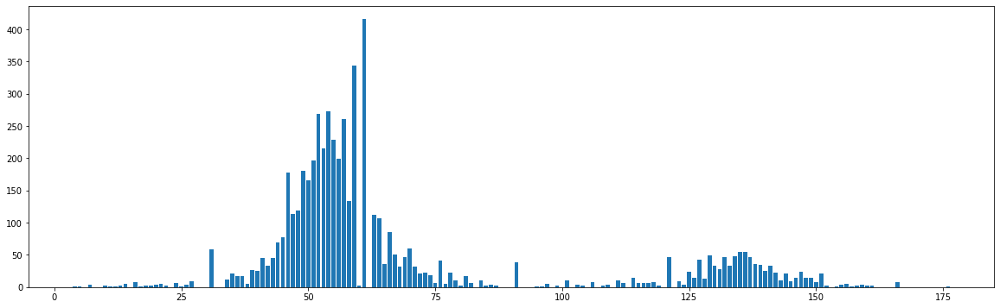

In [306]:
h = hue[hue != 0]
hist = np.histogram(h, bins=np.arange(np.min(h), np.max(h) + 1, 1))
plt.bar(hist[1][1:], hist[0])

In [46]:
from sklearn.cluster import MeanShift, estimate_bandwidth

In [140]:
len(hist[0])

177

In [151]:
np.max(h), np.min(h)

(179, 2)

In [141]:
hist[1]

array([  2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,
        15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,
        28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,
        41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,
        54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,
        67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,
        80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,
        93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104, 105,
       106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118,
       119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131,
       132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144,
       145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157,
       158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170,
       171, 172, 173, 174, 175, 176, 177, 178, 179])

In [173]:
def segment_by_meanshft(hist, window_sz, min_variation, iterations):
    result = np.zeros_like(hist)
    for i, bar in enumerate(hist):
        variation = -1
        iteration = 0
        j = i
        while(iteration < iterations and (variation == -1 or variation > min_variation)):
            iteration += 1
            window_head = max(0, j - window_sz // 2)
            window_tail = min(len(hist) - 1, j + window_sz // 2)
            window = hist[window_head:window_tail + 1]
            mean = np.mean(window)
            new_j = window_head + np.abs(window - mean).argmin()
            variation = np.abs(new_j - j)
            j = new_j
        result[i] = j

    return result


In [307]:
seg_hist = segment_by_meanshft(hist[0], 45, 1, 300)

In [308]:
np.unique(seg_hist)

array([ 10,  62, 102, 107, 140, 142])

In [313]:
hist[1]

array([  3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,
        16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,
        29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
        42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,
        55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,
        68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
        81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104, 105, 106,
       107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119,
       120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132,
       133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145,
       146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158,
       159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171,
       172, 173, 174, 175, 176])

In [309]:
color_table = {orig: newc for orig, newc in zip(list(hist[1][1:]), list(seg_hist))}

In [314]:
color_table[3] = color_table[4]

In [315]:
idxs = np.where(hue != 0)
hs, ws = list(idxs[0]), list(idxs[1])
hh = hue.copy()

for h, w in zip(hs, ws):
    color = hue[h, w]
    hh[h, w] = color_table[color]

(4,
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int32),
 array([[     0,      0,    625,    500, 311905],
        [   405,    251,     20,     25,    271],
        [   355,    267,     17,     15,    119],
        [   385,    284,     19,     16,    205]], dtype=int32),
 array([[311.83715875, 249.45035508],
        [415.36162362, 263.5498155 ],
        [362.6302521 , 274.94117647],
        [393.73170732, 291.69268293]]))

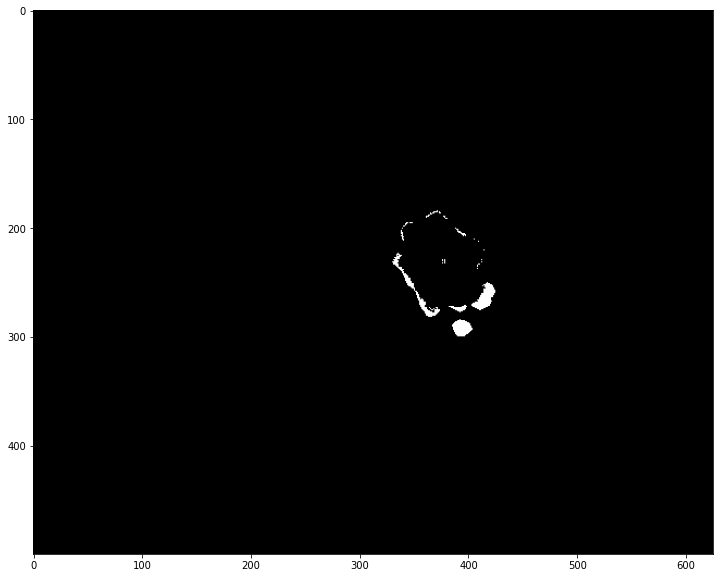

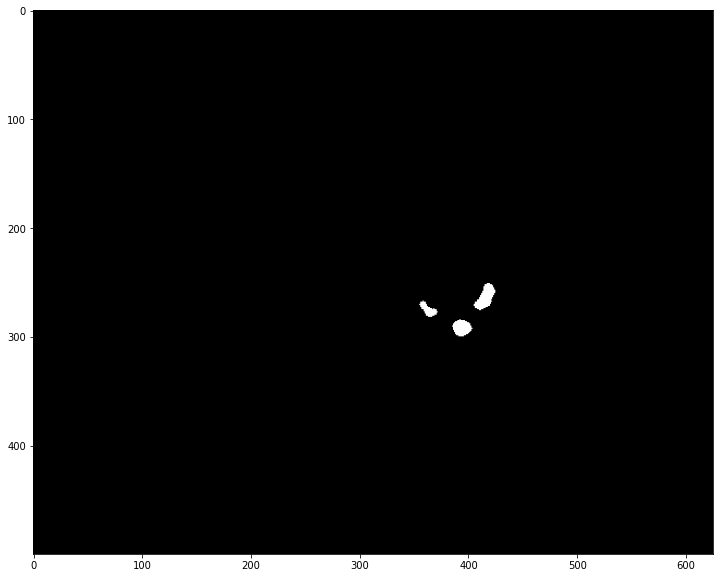

In [319]:
color = 140
f_region = np.zeros(hh.shape, np.uint8)
f_region[hh == color] = 255
show(f_region)
f_region = cv2.morphologyEx(f_region, cv2.MORPH_CLOSE, disk(3))
f_region = cv2.morphologyEx(f_region, cv2.MORPH_OPEN, disk(3))
show(f_region)
conn = cv2.connectedComponentsWithStats(f_region, 8)
conn

In [316]:
offset = 0
regions = np.zeros(hh.shape, dtype=np.int32)
for color in [c for c in np.unique(hh) if c != 0]:
    f_region = np.zeros(hh.shape, np.uint8)
    f_region[hh == color] = 255
    f_region = cv2.morphologyEx(f_region, cv2.MORPH_CLOSE, disk(3))
    f_region = cv2.morphologyEx(f_region, cv2.MORPH_OPEN, disk(3))
    conn = cv2.connectedComponentsWithStats(f_region, 8)[1]
    conn[conn != 0] += offset
    regions = regions | conn
regions += 1

In [225]:
r.dtype

dtype('float32')

In [317]:
ws = cv2.watershed(normalize(r, (0, 255), type=np.uint8), regions)
ixs = np.where(r == (0, 0, 0))
len(ixs)
ws[ixs[:2]] = 0

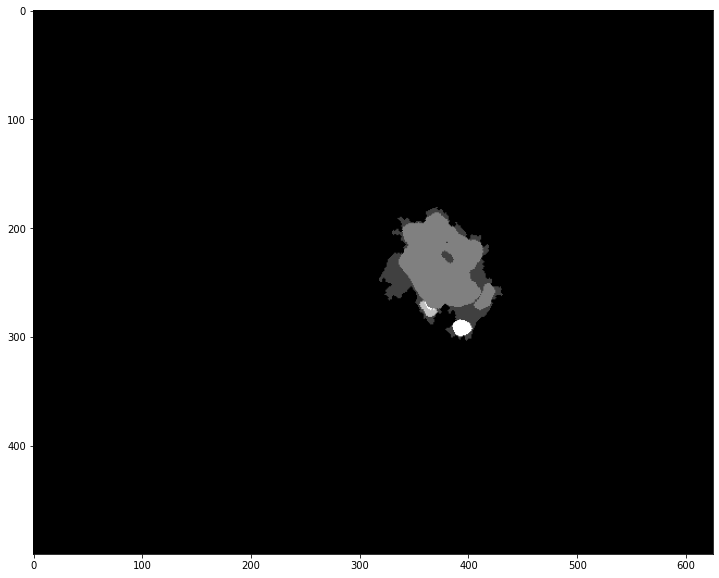

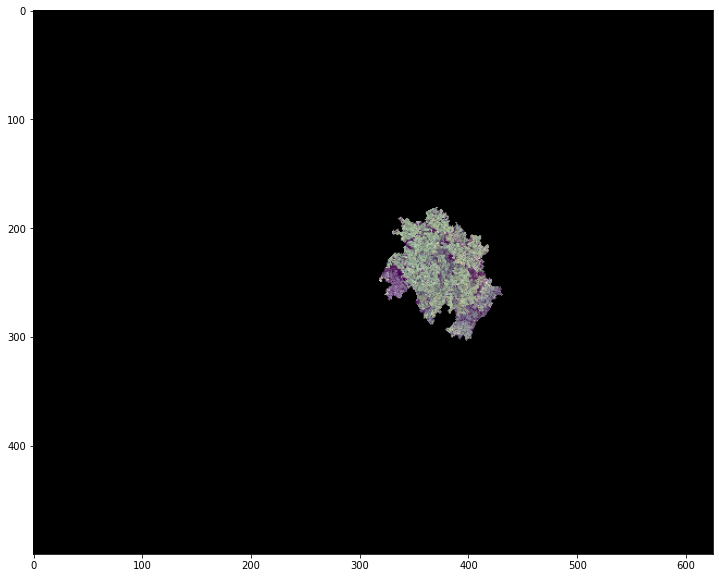

In [318]:
show(ws)
show(r)

In [195]:
for color in [c for c in np.unique(hh) if c != 0]:
    print(color)

1
4
7
11
63
73
83
97
111
126
134
151
169


In [63]:
def euclidean_distance(a, b):
    """returns a np.array containing element-wise euclidean distance between
    np.array :param a: and constant np.array :param b:
    """
    if len(a.shape) > 2:
        return np.sqrt(np.sum(np.square(a - b), axis=(-1)))
    return np.abs(a - b)

In [91]:
bins = hist[1][1:]

idxs = np.where(hue != 0)
hs, ws = list(idxs[0]), list(idxs[1])

for h, w in zip(hs, ws):
    pixel = hue[h, w]
    dists = euclidean_distance(bins, pixel)
    i = np.argmin(dists)
    hue[h, w] = norm_labels[i]
    

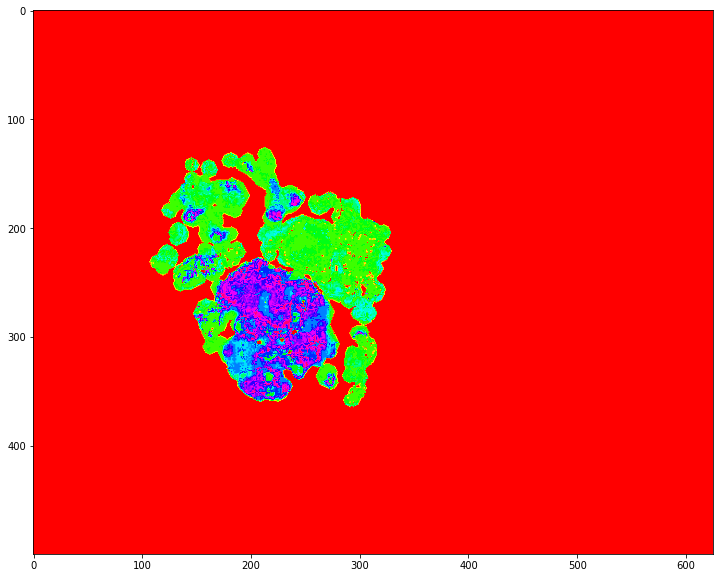

In [92]:
show(hue, cmap='hsv')

In [ ]:
region = hue[blur_seg != 0]
bph = cv2.calcBackProject(hue, [0], cv2.calcHist([hue], [0], blur_seg, [180], [0, 180]), [0, 180], 1)
bph

In [ ]:
bin_size = 40

for i in range(np.min(hue), np.max(hue), bin_size):
    idxs = np.where((hue >= i) & (hue < i + bin_size))
    segment = np.zeros_like(img)
    segment[idxs] = img[idxs]
    show(segment)